In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
import os
from pathlib import Path

drive_path = Path("/content/drive/MyDrive")

zip_files = list(drive_path.glob("*.zip"))

print("ZIP files found in My Drive:")
for file in zip_files:
    print(file)

ZIP files found in My Drive:
/content/drive/MyDrive/archive (7).zip


In [4]:
import os
import zipfile
from pathlib import Path

base_path = Path("/content/macro_project")
raw_path = base_path / "data" / "raw"

# create folders
(raw_path).mkdir(parents=True, exist_ok=True)
(base_path / "outputs" / "eda").mkdir(parents=True, exist_ok=True)
(base_path / "outputs" / "models").mkdir(parents=True, exist_ok=True)
(base_path / "outputs" / "reports").mkdir(parents=True, exist_ok=True)

# use your uploaded zip file
zip_path = Path("/content/drive/MyDrive/archive (7).zip")

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(raw_path)

print("Dataset extracted successfully.")
print("Extracted location:", raw_path)

Dataset extracted successfully.
Extracted location: /content/macro_project/data/raw


In [5]:
import os
from pathlib import Path

raw_path = Path("/content/macro_project/data/raw")

print("Files/folders inside data/raw:")
for item in raw_path.iterdir():
    print(item.name)

Files/folders inside data/raw:
stream_macroinvertebrates


In [6]:
# Stage 1: Exploratory data analysis for macroinvertebrate images

import os
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import random

# Paths
base_path = Path("/content/macro_project")
dataset_path = base_path / "data" / "raw" / "stream_macroinvertebrates"
eda_output_path = base_path / "outputs" / "eda"
eda_output_path.mkdir(parents=True, exist_ok=True)

# Image extensions
image_extensions = [".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"]

records = []

# Scan all images recursively
for img_path in dataset_path.rglob("*"):
    if img_path.suffix.lower() in image_extensions:
        try:
            with Image.open(img_path) as img:
                width, height = img.size

            records.append({
                "file_path": str(img_path),
                "file_name": img_path.name,
                "class_label": img_path.parent.name,
                "width": width,
                "height": height
            })

        except Exception as e:
            print("Error reading:", img_path, e)

# Create dataframe
df = pd.DataFrame(records)

print("Total images found:", len(df))
print("Total classes found:", df["class_label"].nunique())
display(df.head())

Total images found: 2665
Total classes found: 17


,file_path,file_name,class_label,width,height
0,/content/macro_project/data/raw/stream_macroin...,CPH-Asellus sp.-239-t.png,Asellus sp,600,338
1,/content/macro_project/data/raw/stream_macroin...,CPH-Asellus sp.-204-t.png,Asellus sp,600,338
2,/content/macro_project/data/raw/stream_macroin...,CPH-Asellus sp.-182-t.png,Asellus sp,600,338
3,/content/macro_project/data/raw/stream_macroin...,CPH-Asellus sp.-233-t.png,Asellus sp,600,338
4,/content/macro_project/data/raw/stream_macroin...,CPH-Asellus sp.-156-t.png,Asellus sp,600,338


In [7]:
# Summary table

summary = pd.DataFrame({
    "Total images": [len(df)],
    "Total classes": [df["class_label"].nunique()],
    "Average width": [round(df["width"].mean(), 2)],
    "Average height": [round(df["height"].mean(), 2)],
    "Minimum width": [df["width"].min()],
    "Maximum width": [df["width"].max()],
    "Minimum height": [df["height"].min()],
    "Maximum height": [df["height"].max()]
})

display(summary)

summary.to_csv(eda_output_path / "summary_table.csv", index=False)
print("Summary table saved.")

,Total images,Total classes,Average width,Average height,Minimum width,Maximum width,Minimum height,Maximum height
0,2665,17,599.27,389.98,274,600,274,600


Summary table saved.


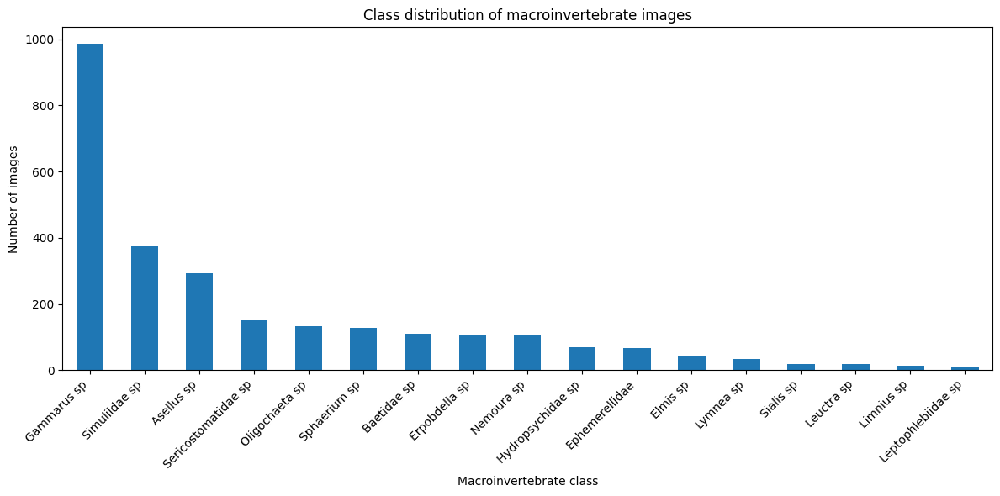

In [8]:
# Class distribution chart

class_counts = df["class_label"].value_counts()

plt.figure(figsize=(12, 6))
class_counts.plot(kind="bar")
plt.title("Class distribution of macroinvertebrate images")
plt.xlabel("Macroinvertebrate class")
plt.ylabel("Number of images")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.savefig(eda_output_path / "class_distribution.png", dpi=300)
plt.show()

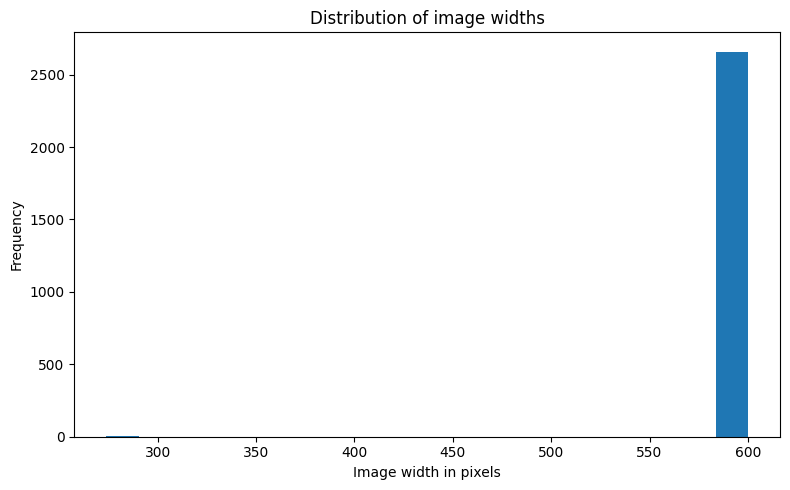

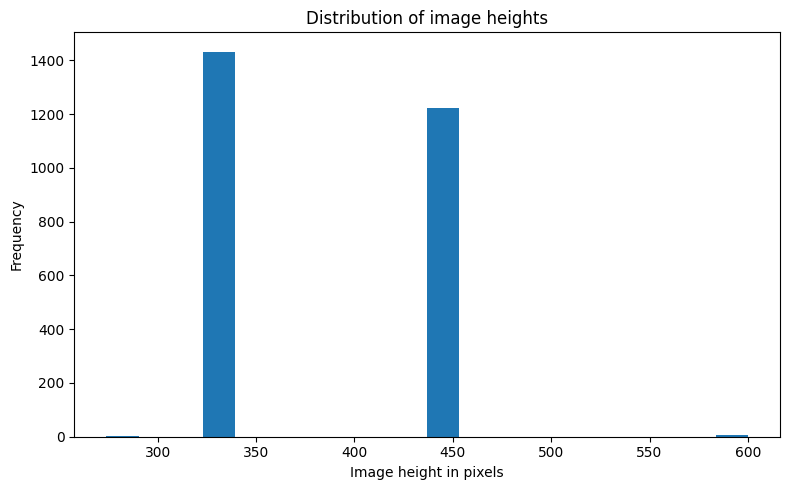

In [9]:
# Image width distribution

plt.figure(figsize=(8, 5))
plt.hist(df["width"], bins=20)
plt.title("Distribution of image widths")
plt.xlabel("Image width in pixels")
plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig(eda_output_path / "image_width_distribution.png", dpi=300)
plt.show()


# Image height distribution

plt.figure(figsize=(8, 5))
plt.hist(df["height"], bins=20)
plt.title("Distribution of image heights")
plt.xlabel("Image height in pixels")
plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig(eda_output_path / "image_height_distribution.png", dpi=300)
plt.show()

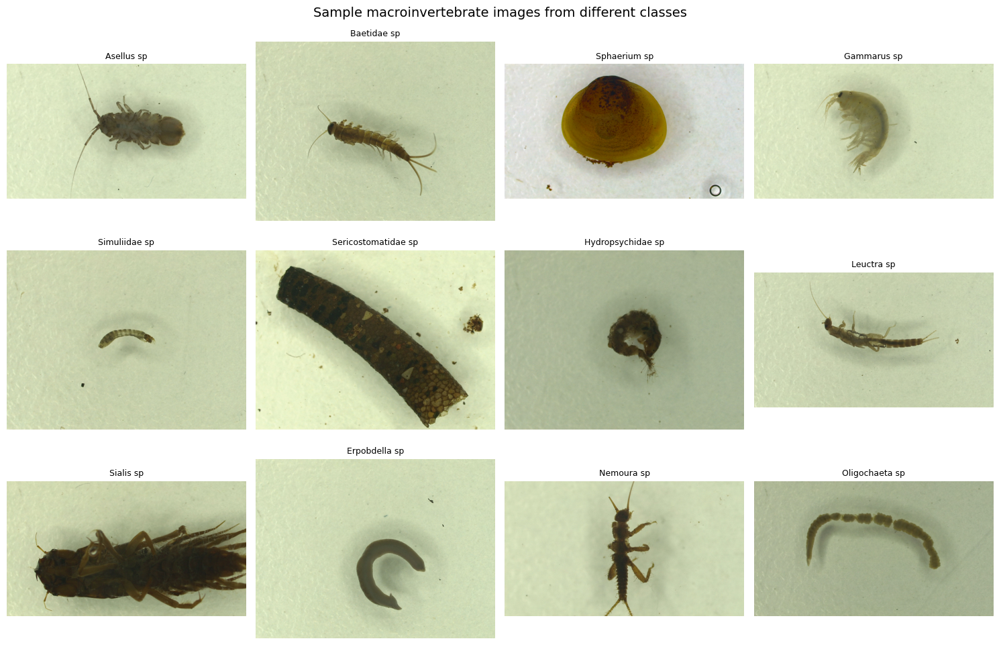

In [10]:
# Sample image grid

sample_df = df.groupby("class_label").head(1)

plt.figure(figsize=(15, 10))

for i, row in enumerate(sample_df.head(12).itertuples(), start=1):
    img = Image.open(row.file_path)
    plt.subplot(3, 4, i)
    plt.imshow(img)
    plt.title(row.class_label, fontsize=9)
    plt.axis("off")

plt.suptitle("Sample macroinvertebrate images from different classes", fontsize=14)
plt.tight_layout()
plt.savefig(eda_output_path / "sample_image_grid.png", dpi=300)
plt.show()

In [11]:
print("EDA output files saved:")
for file in eda_output_path.iterdir():
    print(file.name)

EDA output files saved:
image_width_distribution.png
sample_image_grid.png
image_height_distribution.png
summary_table.csv
class_distribution.png


eda completed


Stage 2: Classification model


In [12]:
!pip install opencv-python scikit-learn joblib -q

In [13]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder
import joblib

In [14]:
# Paths
base_path = Path("/content/macro_project")
eda_output_path = base_path / "outputs" / "eda"
model_output_path = base_path / "outputs" / "models"
report_output_path = base_path / "outputs" / "reports"

model_output_path.mkdir(parents=True, exist_ok=True)
report_output_path.mkdir(parents=True, exist_ok=True)

# Image size for model
IMAGE_SIZE = (64, 64)   # faster in Colab; you may change to (128, 128) if runtime is okay

X = []
y = []

print("Processing images...")

for index, row in df.iterrows():
    image_path = row["file_path"]
    label = row["class_label"]

    try:
        # Load image in grayscale
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        if image is None:
            continue

        # Resize image
        image = cv2.resize(image, IMAGE_SIZE)

        # Normalise pixel values to 0-1
        image = image / 255.0

        # Flatten image into 1D array
        X.append(image.flatten())
        y.append(label)

    except Exception as e:
        print("Error processing:", image_path, e)

X = np.array(X)
y = np.array(y)

print("Total processed images:", len(X))
print("Feature shape:", X.shape)
print("Total labels:", len(y))

Processing images...
Total processed images: 2665
Feature shape: (2665, 4096)
Total labels: 2665


In [15]:
# Convert class names into numeric labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Train-test split: 80% training, 20% testing
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y_encoded,
    test_size=0.2,
    random_state=42,
    stratify=y_encoded
)

print("Training images:", X_train.shape[0])
print("Testing images:", X_test.shape[0])
print("Classes:", list(label_encoder.classes_))

Training images: 2132
Testing images: 533
Classes: [np.str_('Asellus sp'), np.str_('Baetidae sp'), np.str_('Elmis sp'), np.str_('Ephemerellidae'), np.str_('Erpobdella sp'), np.str_('Gammarus sp'), np.str_('Hydropsychidae sp'), np.str_('Leptophlebiidae sp'), np.str_('Leuctra sp'), np.str_('Limnius sp'), np.str_('Lymnea sp'), np.str_('Nemoura sp'), np.str_('Oligochaeta sp'), np.str_('Sericostomatidae sp'), np.str_('Sialis sp'), np.str_('Simuliidae sp'), np.str_('Sphaerium sp')]


In [16]:
# Train Random Forest model
rf_model = RandomForestClassifier(
    n_estimators=100,
    random_state=42,
    n_jobs=-1
)

rf_model.fit(X_train, y_train)

print("Model training completed.")

Model training completed.


In [17]:
# Predict on test data
y_pred = rf_model.predict(X_test)

# Accuracy score
accuracy = accuracy_score(y_test, y_pred)

print("Model accuracy:", round(accuracy * 100, 2), "%")

Model accuracy: 68.48 %


In [18]:
# Classification report
report = classification_report(
    y_test,
    y_pred,
    target_names=label_encoder.classes_
)

print(report)

# Save report
report_file = report_output_path / "classification_report.txt"

with open(report_file, "w") as f:
    f.write("Macroinvertebrate Image Classification Report\n")
    f.write("============================================\n\n")
    f.write(f"Model accuracy: {round(accuracy * 100, 2)}%\n\n")
    f.write(report)

print("Classification report saved to:", report_file)

                     precision    recall  f1-score   support

         Asellus sp       0.64      0.71      0.67        59
        Baetidae sp       0.75      0.14      0.23        22
           Elmis sp       1.00      0.33      0.50         9
     Ephemerellidae       1.00      0.14      0.25        14
      Erpobdella sp       0.45      0.24      0.31        21
        Gammarus sp       0.67      0.96      0.79       197
  Hydropsychidae sp       0.60      0.21      0.32        14
 Leptophlebiidae sp       0.00      0.00      0.00         2
         Leuctra sp       0.00      0.00      0.00         4
         Limnius sp       1.00      0.33      0.50         3
          Lymnea sp       0.33      0.17      0.22         6
         Nemoura sp       0.42      0.24      0.30        21
     Oligochaeta sp       0.72      0.48      0.58        27
Sericostomatidae sp       0.75      0.80      0.77        30
          Sialis sp       1.00      0.25      0.40         4
      Simuliidae sp    

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<Figure size 1200x1000 with 0 Axes>

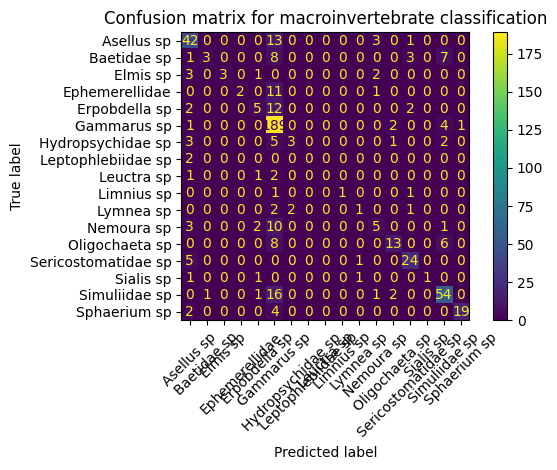

Confusion matrix saved to: /content/macro_project/outputs/reports/confusion_matrix.png


In [19]:
# Confusion matrix
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(12, 10))
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=label_encoder.classes_
)

disp.plot(cmap=None, xticks_rotation=45)
plt.title("Confusion matrix for macroinvertebrate classification")
plt.tight_layout()

confusion_matrix_path = report_output_path / "confusion_matrix.png"
plt.savefig(confusion_matrix_path, dpi=300)
plt.show()

print("Confusion matrix saved to:", confusion_matrix_path)

In [20]:
# Save model, label encoder, and image size together
model_package = {
    "model": rf_model,
    "label_encoder": label_encoder,
    "image_size": IMAGE_SIZE
}

model_file = model_output_path / "macroinvertebrate_random_forest_model.joblib"

joblib.dump(model_package, model_file)

print("Model saved successfully to:", model_file)

Model saved successfully to: /content/macro_project/outputs/models/macroinvertebrate_random_forest_model.joblib


In [21]:
def predict_macroinvertebrate(image_path):
    saved_package = joblib.load(model_file)

    model = saved_package["model"]
    label_encoder = saved_package["label_encoder"]
    image_size = saved_package["image_size"]

    image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)

    if image is None:
        return "Error: image could not be loaded."

    image = cv2.resize(image, image_size)
    image = image / 255.0
    image = image.flatten().reshape(1, -1)

    prediction = model.predict(image)
    predicted_class = label_encoder.inverse_transform(prediction)[0]

    return predicted_class


# Test with first image from dataframe
sample_image_path = df.iloc[0]["file_path"]

predicted_class = predict_macroinvertebrate(sample_image_path)

print("Sample image:", sample_image_path)
print("Predicted class:", predicted_class)
print("Actual class:", df.iloc[0]["class_label"])

Sample image: /content/macro_project/data/raw/stream_macroinvertebrates/Asellus sp/CPH-Asellus sp.-239-t.png
Predicted class: Asellus sp
Actual class: Asellus sp


In [22]:
print("Model files:")
for file in model_output_path.iterdir():
    print(file.name)

print("\nReport files:")
for file in report_output_path.iterdir():
    print(file.name)

Model files:
macroinvertebrate_random_forest_model.joblib

Report files:
confusion_matrix.png
classification_report.txt


simple console app menu


In [23]:
# Stage 3: Simple console application

import joblib
import cv2
import numpy as np
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

base_path = Path("/content/macro_project")
model_file = base_path / "outputs" / "models" / "macroinvertebrate_random_forest_model.joblib"
report_file = base_path / "outputs" / "reports" / "classification_report.txt"
eda_output_path = base_path / "outputs" / "eda"

def show_dataset_summary():
    print("Dataset summary")
    print("----------------")
    print("Total images:", len(df))
    print("Total classes:", df["class_label"].nunique())
    print("Average width:", round(df["width"].mean(), 2))
    print("Average height:", round(df["height"].mean(), 2))
    print("\nImages per class:")
    print(df["class_label"].value_counts())

def show_eda_outputs():
    print("EDA output files")
    print("----------------")
    for file in eda_output_path.iterdir():
        print(file.name)

def show_classification_report():
    print("Classification report")
    print("---------------------")
    if report_file.exists():
        with open(report_file, "r") as f:
            print(f.read())
    else:
        print("Report file not found.")

def predict_image(image_path):
    if not model_file.exists():
        print("Model file not found. Please train the model first.")
        return

    saved_package = joblib.load(model_file)

    model = saved_package["model"]
    label_encoder = saved_package["label_encoder"]
    image_size = saved_package["image_size"]

    image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)

    if image is None:
        print("Error: image could not be loaded. Check the file path.")
        return

    image_resized = cv2.resize(image, image_size)
    image_normalised = image_resized / 255.0
    image_flattened = image_normalised.flatten().reshape(1, -1)

    prediction = model.predict(image_flattened)
    predicted_class = label_encoder.inverse_transform(prediction)[0]

    print("Predicted macroinvertebrate class:", predicted_class)

    original_image = Image.open(image_path)
    plt.imshow(original_image)
    plt.title(f"Predicted class: {predicted_class}")
    plt.axis("off")
    plt.show()

def console_app():
    while True:
        print("\nMacroinvertebrate image analysis system")
        print("---------------------------------------")
        print("1. Show dataset summary")
        print("2. Show EDA output files")
        print("3. Show classification report")
        print("4. Predict a sample image")
        print("5. Exit")

        choice = input("Enter your choice 1-5: ")

        if choice == "1":
            show_dataset_summary()

        elif choice == "2":
            show_eda_outputs()

        elif choice == "3":
            show_classification_report()

        elif choice == "4":
            sample_image_path = df.iloc[0]["file_path"]
            print("Using sample image:", sample_image_path)
            predict_image(sample_image_path)

        elif choice == "5":
            print("Exiting application.")
            break

        else:
            print("Invalid choice. Please enter a number from 1 to 5.")

console_app()


Macroinvertebrate image analysis system
---------------------------------------
1. Show dataset summary
2. Show EDA output files
3. Show classification report
4. Predict a sample image
5. Exit
Enter your choice 1-5: 3
Classification report
---------------------
Macroinvertebrate Image Classification Report

Model accuracy: 68.48%

                     precision    recall  f1-score   support

         Asellus sp       0.64      0.71      0.67        59
        Baetidae sp       0.75      0.14      0.23        22
           Elmis sp       1.00      0.33      0.50         9
     Ephemerellidae       1.00      0.14      0.25        14
      Erpobdella sp       0.45      0.24      0.31        21
        Gammarus sp       0.67      0.96      0.79       197
  Hydropsychidae sp       0.60      0.21      0.32        14
 Leptophlebiidae sp       0.00      0.00      0.00         2
         Leuctra sp       0.00      0.00      0.00         4
         Limnius sp       1.00      0.33      0.50     

In [29]:
from IPython.display import display, Image as IPythonImage
from pathlib import Path

eda_output_path = Path("/content/macro_project/outputs/eda")

def show_eda_outputs():
    print("EDA output files")
    print("----------------")

    for file in eda_output_path.iterdir():
        print(file.name)

    print("\nDisplaying EDA charts")
    print("---------------------")

    chart_files = [
        "class_distribution.png",
        "image_width_distribution.png",
        "image_height_distribution.png",
        "sample_image_grid.png"
    ]

    for chart in chart_files:
        chart_path = eda_output_path / chart

        if chart_path.exists():
            print("\nShowing:", chart)
            display(IPythonImage(filename=str(chart_path)))
        else:
            print(chart, "not found.")


Macroinvertebrate image analysis system
---------------------------------------
1. Show dataset summary
2. Show EDA output files
3. Show classification report
4. Predict a sample image
5. Exit
Enter your choice 1-5: 1
Dataset summary
----------------
Total images: 2665
Total classes: 17
Average width: 599.27
Average height: 389.98

Images per class:
class_label
Gammarus sp            987
Simuliidae sp          374
Asellus sp             294
Sericostomatidae sp    151
Oligochaeta sp         134
Sphaerium sp           127
Baetidae sp            109
Erpobdella sp          107
Nemoura sp             106
Hydropsychidae sp       69
Ephemerellidae          68
Elmis sp                45
Lymnea sp               33
Sialis sp               19
Leuctra sp              19
Limnius sp              14
Leptophlebiidae sp       9
Name: count, dtype: int64

Macroinvertebrate image analysis system
---------------------------------------
1. Show dataset summary
2. Show EDA output files
3. Show classificati

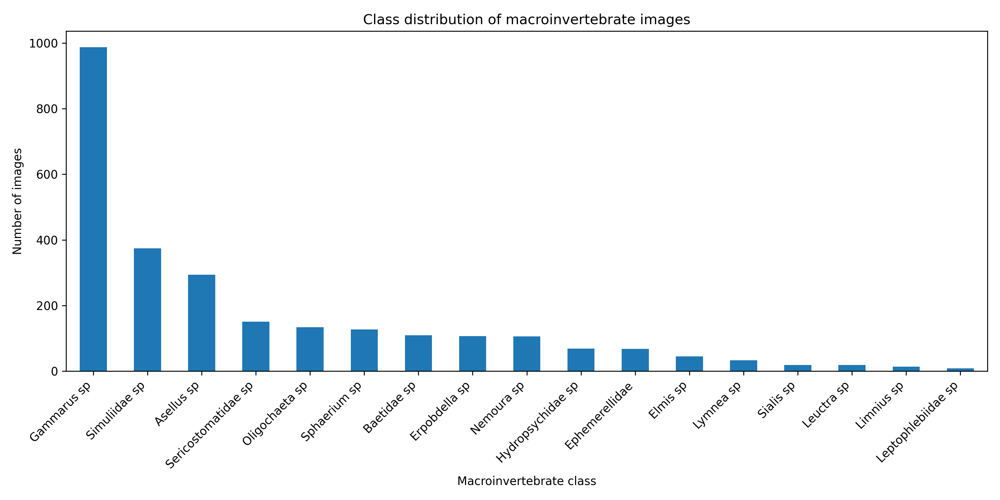


Showing: image_width_distribution.png


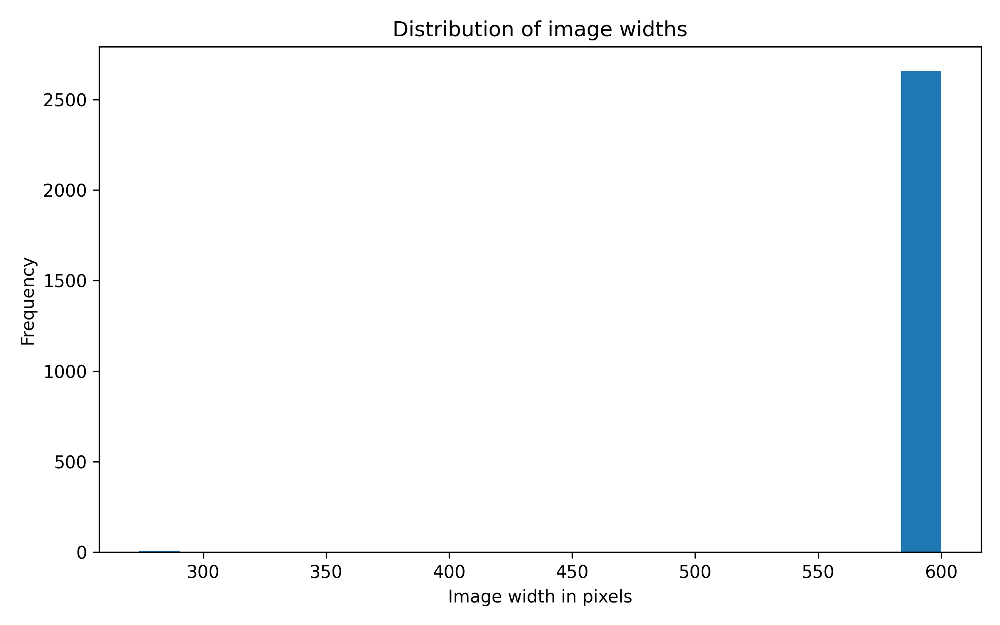


Showing: image_height_distribution.png


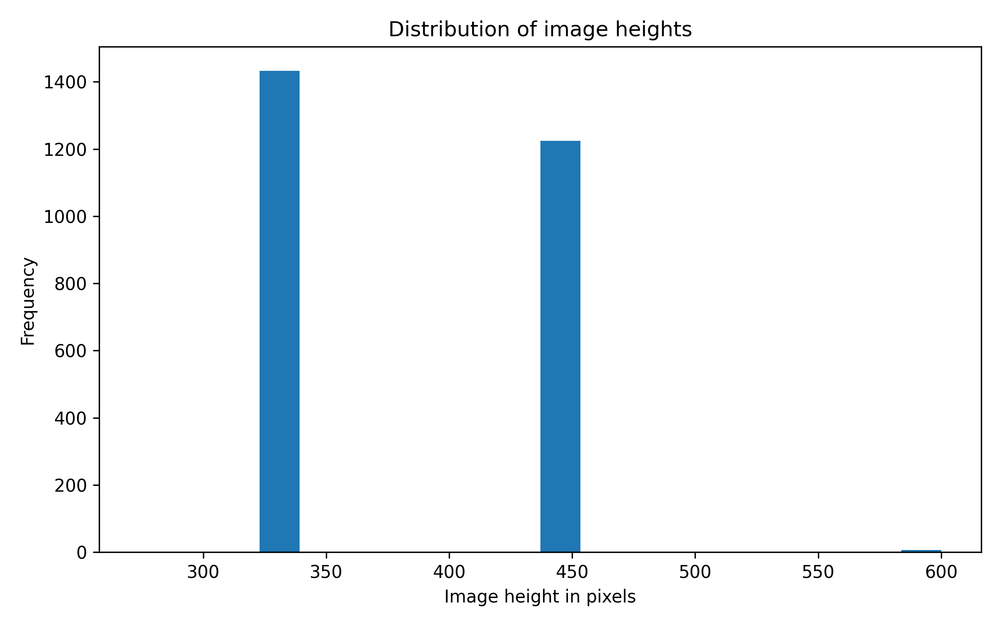


Showing: sample_image_grid.png


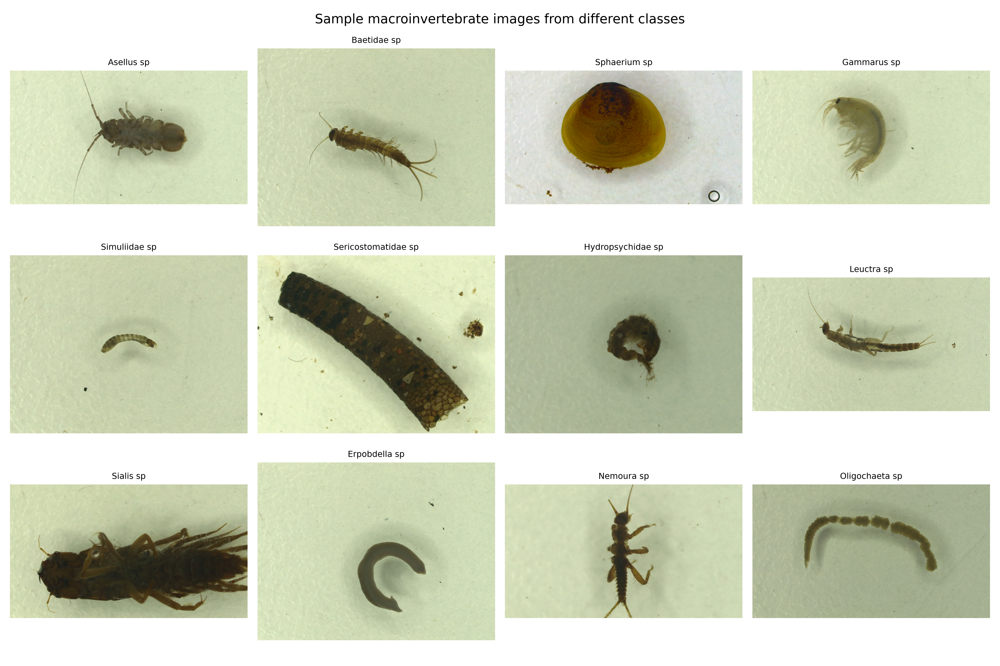


Macroinvertebrate image analysis system
---------------------------------------
1. Show dataset summary
2. Show EDA output files
3. Show classification report
4. Predict a sample image
5. Exit
Enter your choice 1-5: 3
Classification report
---------------------
Macroinvertebrate Image Classification Report

Model accuracy: 68.48%

                     precision    recall  f1-score   support

         Asellus sp       0.64      0.71      0.67        59
        Baetidae sp       0.75      0.14      0.23        22
           Elmis sp       1.00      0.33      0.50         9
     Ephemerellidae       1.00      0.14      0.25        14
      Erpobdella sp       0.45      0.24      0.31        21
        Gammarus sp       0.67      0.96      0.79       197
  Hydropsychidae sp       0.60      0.21      0.32        14
 Leptophlebiidae sp       0.00      0.00      0.00         2
         Leuctra sp       0.00      0.00      0.00         4
         Limnius sp       1.00      0.33      0.50     

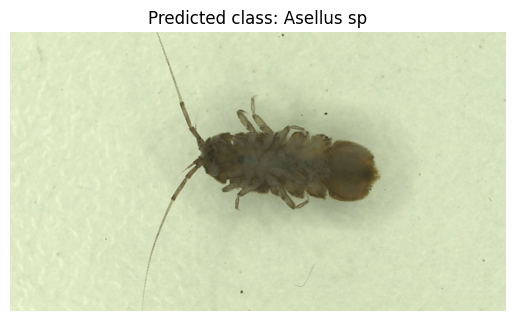


Macroinvertebrate image analysis system
---------------------------------------
1. Show dataset summary
2. Show EDA output files
3. Show classification report
4. Predict a sample image
5. Exit
Enter your choice 1-5: 9
Invalid choice. Please enter a number from 1 to 5.

Macroinvertebrate image analysis system
---------------------------------------
1. Show dataset summary
2. Show EDA output files
3. Show classification report
4. Predict a sample image
5. Exit
Enter your choice 1-5: 5
Exiting application.


In [30]:
console_app()

In [31]:
manual_testing_content = """
# Manual testing evidence

| Test scenario | Input used | Expected result | Actual result | Status |
|---|---|---|---|---|
| Dataset summary | Enter 1 | Dataset summary is displayed | Dataset summary displayed successfully | Passed |
| EDA output files | Enter 2 | Saved EDA files are shown | EDA output files displayed successfully | Passed |
| Classification report | Enter 3 | Accuracy, precision, recall and F1-score are displayed | Classification report displayed successfully | Passed |
| Predict sample image | Enter 4 | Predicted class and image are displayed | Prediction displayed successfully | Passed |
| Invalid menu choice | Enter 9 | Invalid choice message appears | Invalid choice message displayed successfully | Passed |
| Exit application | Enter 5 | Application closes | Application exited successfully | Passed |
"""

testing_file = base_path / "MANUAL_TESTING.md"

with open(testing_file, "w") as f:
    f.write(manual_testing_content)

print("MANUAL_TESTING.md created successfully.")

MANUAL_TESTING.md created successfully.


In [32]:
readme_content = """
# Macroinvertebrate image analysis system

## Project overview
This project is a Python-based image analysis system for freshwater macroinvertebrate images. It performs exploratory data analysis, trains a Random Forest classification model, and provides a simple console menu application.

## Dataset
The project uses the Stream Macroinvertebrates dataset from Kaggle.

## Main features
- Loads macroinvertebrate image folders
- Creates dataset summary
- Generates EDA charts
- Trains a Random Forest classifier
- Produces accuracy, classification report and confusion matrix
- Saves the trained model using joblib
- Provides a console menu application for summary, EDA, report and prediction

## Python packages used
- pathlib: file path management
- pandas: image metadata table
- numpy: numerical array handling
- OpenCV: image loading, resizing and preprocessing
- matplotlib: charts and image display
- scikit-learn: model training and evaluation
- joblib: saving and loading the trained model
- PIL: image display

## How to run
1. Open the notebook in Google Colab.
2. Mount Google Drive.
3. Extract the dataset into data/raw.
4. Run the EDA section.
5. Run the classification section.
6. Run the console app section.

## Outputs
- outputs/eda/class_distribution.png
- outputs/eda/image_width_distribution.png
- outputs/eda/image_height_distribution.png
- outputs/eda/sample_image_grid.png
- outputs/eda/summary_table.csv
- outputs/reports/classification_report.txt
- outputs/reports/confusion_matrix.png
- outputs/models/macroinvertebrate_random_forest_model.joblib

## Testing
Manual testing evidence is included in MANUAL_TESTING.md.
"""

readme_file = base_path / "README.md"

with open(readme_file, "w") as f:
    f.write(readme_content)

print("README.md created successfully.")

README.md created successfully.


In [33]:
import shutil

zip_output = "/content/macro_project_final"
shutil.make_archive(zip_output, "zip", "/content/macro_project")

print("Project zipped successfully.")
print("File location: /content/macro_project_final.zip")

Project zipped successfully.
File location: /content/macro_project_final.zip


In [34]:
from google.colab import files

files.download("/content/macro_project_final.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>